# Data Science Assessment - Bas Poot
This notebook contains code for the data science assessment of Bas Poot. In this notebook a classification model is trained and evaluated on the data. Please note that I primarily highlight the observations which contribute to a better performance of the model. Please note that I did not create alot of graphs since I don't have contextual information on the variables. In a real-life settings you want to do this since it can give hints about issues with the data which can introduce bias in the model.

The structure of the notebook is as follows:

1. Data Exploration,
2. Data Preparation,
3. Modeling,
4. Evaluation,
5. Conclusion and remarks.

In [8]:
# Setting some options
import pandas as pd
pd.options.display.max_rows = 999

# Loading training data
filepath_training = './data/training_grover.csv'
df_train = pd.read_csv(filepath_training, sep=";", decimal=".")
df_train = df_train.drop(df_train.columns[0], axis=1)


## Data exploration
For the data exploration, pandas profiling is used. The goal is to identify issues with the data and to get a better understanding of the data. This understanding includes type of variables, the balance of the dataset, the distributions, missing values, etc.

In [9]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df_train, title='Grover Assessment')
profile

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]


### Observations on raw data
Below are some of the things I observed in the data, can introduce issues or bias during modelling and thus need to be addressed.

* Dataset contains numeric variables with two seperate decimal operators (, and .), for correct data type interpretation I will change it to '.'.
* Some variables contain question marks (likely missing values), I will replace this for None values.
* Variables x.2, x.7, x.10, x.13, x.14, x.19 have numeric values and letters (t and f), I will cast these values to numeric (int or float).
* Variables x.3, x.4, x.8, x.12 have few distinct values, and thus will probably contain little discriminative power.
* Variables x.20, x.16 have either missing values or t and f, these are boolean,
* Variable x.1, x.17, x.18 uses comma for decimals,
* Variables x.20 and x.16 have a high correlation with the target variable y, these will likely have high predictive power.
* y is a binary variable and is imbalanced, important to note when interpreting the performance of the model.
* The dataset contains duplicate rows, which can introduce bias to the model, further investigation would be nice to do, but for now I will remove these from the training set.

Numeric variables: x.2, x.7, x.10, x.13, x.14, x.19

Bool variables: x.0, x.9, x.11, x.20, x.16

Categorical variables: x.3, x.4, x.5, x.6, x.12, x.8

Please note that I did not mentioned statistical properties of the dataset, like distributions of variables, percentage missing data, number of observations, etc. These figures are included in the pandas profiling profile. 

## Data preperation
For the datapreparation I use pandas. In a production setting, I would likely use Sklearn pipelines to prevent errors when the underlying data changes.

I applied the following transformations to prepare the data for modelling:
1. Replace values of ? for None values
2. Replace t and f for boolean values 1 and 0 respectively
3. Replace decimal symbol , for .
4. Cast variables to their respective types
5. One-hot encode categorical variables for use in XGboost classifier,
6. Remove duplicate observations.

In [10]:
# Read in data
filepath_training = './data/training_grover.csv'
df_train = pd.read_csv(filepath_training, sep=";", decimal=".")
df_train = df_train.drop(df_train.columns[0], axis=1)

# Drop duplicates
df_train = df_train.drop_duplicates()

# Replace ? symbol for None value
df_train = df_train.replace('?', None)

# Replace t and f for boolean values 1 and 0 respectively
df_train = df_train.replace('f', 0)
df_train = df_train.replace('t', 1)

# Replace decimal symbol , for .
df_train.loc[:, 'x.1'] = pd.to_numeric(df_train['x.1'].str.replace(',','.'))
df_train.loc[:, 'x.17'] = pd.to_numeric(df_train['x.17'].str.replace(',','.'))
df_train.loc[:, 'x.18'] = pd.to_numeric(df_train['x.18'].str.replace(',','.'))

# Cast numeric variables to numeric type (int or float)
numeric_vars = ['x.2', 'x.7', 'x.10', 'x.13', 'x.14', 'x.19']
for var in numeric_vars:
    df_train.loc[:,var] =  pd.to_numeric(df_train[var])

# Cast bool variables to bool type 
bool_vars = ['x.0', 'x.9', 'x.11', 'x.20', 'x.16']
for var in bool_vars:
    df_train.loc[:,var] = df_train.loc[:,var].astype(bool)

# One-hot encode cat variables
cat_variables = ['x.3','x.4','x.5','x.6','x.12','x.8']

for var in cat_variables:
    df_dummies = pd.get_dummies(df_train.loc[:,var], prefix=var)
    df_train = df_train.drop(var, axis=1)
    df_train = pd.concat([df_dummies, df_train], axis=1)

df_train.loc[:,'y'] = df_train.loc[:,'y'].replace('good', 1)
df_train.loc[:,'y'] = df_train.loc[:,'y'].replace('bad', 0)

In [11]:
# Create a profile of the cleaned/prepped data
from pandas_profiling import ProfileReport
profile = ProfileReport(df_train, title='Grover Assessment')
profile

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.63s/it]


### Modeling

**Model Selection**

A XGboost classifier has been chosen since it is known to be a powerful and robust model. Positive points are for instance its ability to handle missing values and the built-in regularization. Of course other models might perform better and should be evaluated in a production setting where high performance is required. For this assessments that seemed a bit of overkill and other techniques like feature engineering will likely give a better ROI regarding performance.

Due to the way ensembles of decision tree algorithms work (like gradient boosting), I will not spend time selecting features. I will add them all and briefly highlight which features add discriminative power.

Some parameter tuning has been done, although performance on the training set was already near perfect.  



**Perfomance measure**

The F1 score is chosen as scoring metric, since it is suited for assessing performance when you are working with an imbalanced target variable and are doing a (binary) classification.

In [12]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Split features and target variables (X, y), choose all variables as features except for the target and variables with known issues.
selected_features = df_train.columns != 'y'
excluded_features = ['y', 'x.16', 'x.20']
selected_features = [x for x in df_train.columns if x not in excluded_features]
# selected_features = ['x.8_1', 'x.1', 'x.2', 'x.7', 'x.9', 'x.10', 'x.11', 'x.13', 'x.14','x.20', 'x.17', 'x.18']

X_train = df_train.loc[:, selected_features]
y_train = df_train.loc[:, 'y']

features = X_train.columns

# Setting up the model
model = XGBClassifier(learning_rate=0.1, min_samples_split=500,min_samples_leaf=50,max_depth=8,max_features='sqrt',subsample=0.8,random_state=10)

param_test1 = {'n_estimators':range(20,81,10)}

# A gridsearch is done to tune hyperparameters. 
# Cross validation is used to reduce overfitting, so that we will choose the model which generalizes the best.
gsearch1 = GridSearchCV(estimator=model, param_grid=param_test1, scoring='roc_auc',n_jobs=4, cv=5)

gsearch1.fit(X_train, y_train)

[13:43:36] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1637426408905/work/src/learner.cc:576: 
Parameters: { "max_features", "min_samples_leaf", "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[13:43:36] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1637426408905/work/src/learner.cc:576: 
Parameters: { "max_features", "min_samples_leaf", "min_samples_split" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[13:43:36] WARNING: /Users/runner/miniforge3/conda-bld/xgboost

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     enable_categorical=False, gamma=None,
                                     gpu_id=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.1, max_delta_step=None,
                                     max_depth=8, max_features='sqrt',
                                     min_child_weight=None, min_samples_leaf=50,
                                     min_samples_split=500, missing=nan,
                                     monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
       

In [21]:
# Using best model and extracting the feature importance measure
model = gsearch1.best_estimator_
feature_importance = pd.Series(dict(zip(X_train.columns, model.feature_importances_)))
feature_importance.sort_values(ascending=False)

mask_non_important_features = feature_importance == 0

important_features = pd.Series(feature_importance[~mask_non_important_features])
non_important_features = pd.Series(feature_importance[mask_non_important_features])

print("Top 10 most important features:")
print(important_features.sort_values(ascending=False).head(10))
print()
print("Featurs which do not contribute to performance:")
print(non_important_features)


Top 10 most important features:
x.8_1     0.305121
x.12_p    0.073667
x.4_gg    0.056632
x.6_n     0.045706
x.5_m     0.032075
x.8_c     0.029418
x.5_x     0.027479
x.9       0.024796
x.10      0.023588
x.12_g    0.023278
dtype: float32

Featurs which do not contribute to performance:
x.6_dd    0.0
x.6_j     0.0
x.6_o     0.0
x.5_e     0.0
x.5_i     0.0
x.5_j     0.0
x.5_r     0.0
x.3_l     0.0
x.3_u     0.0
x.3_y     0.0
x.0       0.0
x.19      0.0
dtype: float32


The graph below gives an indication of feature importance for this particular model. Please note that this type shows the average gain across all splits where feature was used. This is my preferred measure for feature importance. Since we used one-hot-encoding for some variables, it might look like a certain variable is less important than it is.


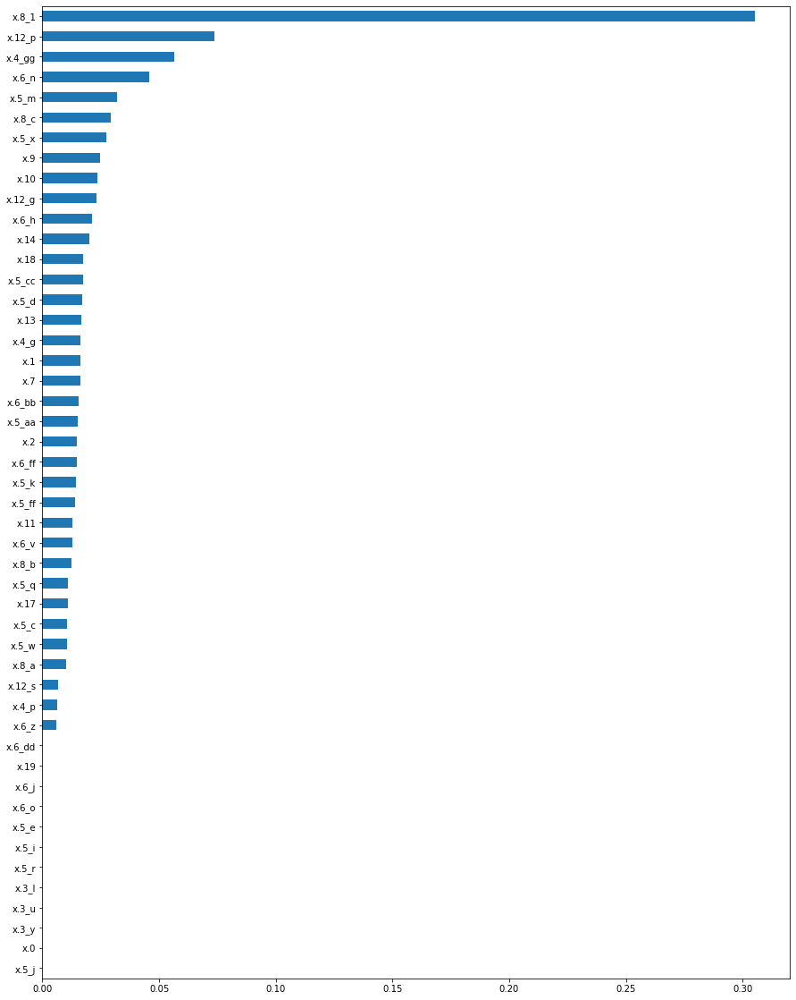

In [38]:
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline


print("The graph below gives an indication of feature importance for this particular model. Please note that this type shows the average gain across all splits where feature was used. This is my preferred measure for feature importance. Since we used one-hot-encoding for some variables, it might look like a certain variable is less important than it is.")
pd.Series(feature_importance).sort_values().plot(kind='barh', figsize=(15,20))
plt.show()

In [14]:
# Read in data
filepath_validation = './data/validation_grover.csv'
df_validation = pd.read_csv(filepath_validation, sep=";", decimal=".")
df_validation = df_validation.drop(df_validation.columns[0], axis=1)

# Replace ? symbol for None value
df_validation = df_validation.replace('?', None)

# Replace t and f for boolean values 1 and 0 respectively
df_validation = df_validation.replace('f', 0)
df_validation = df_validation.replace('t', 1)

# Replace decimal symbol , for .
df_validation.loc[:, 'x.1'] = pd.to_numeric(df_validation['x.1'].str.replace(',','.'))
df_validation.loc[:, 'x.17'] = pd.to_numeric(df_validation['x.17'].str.replace(',','.'))
df_validation.loc[:, 'x.18'] = pd.to_numeric(df_validation['x.18'].str.replace(',','.'))

# Cast numeric variables to numeric type (int or float)
numeric_vars = ['x.2', 'x.7', 'x.10', 'x.13', 'x.14', 'x.19']
for var in numeric_vars:
    df_validation.loc[:,var] =  pd.to_numeric(df_validation[var])

# Cast bool variables to bool type 
bool_vars = ['x.0', 'x.9', 'x.11', 'x.20', 'x.16']
for var in bool_vars:
    df_validation.loc[:,var] = df_validation.loc[:,var].astype(bool)

# One-hot encode cat variables
cat_variables = ['x.3','x.4','x.5','x.6','x.12','x.8']

for var in cat_variables:
    df_dummies = pd.get_dummies(df_validation.loc[:,var], prefix=var)
    df_validation = df_validation.drop(var, axis=1)
    df_validation = pd.concat([df_dummies, df_validation], axis=1)

df_validation.loc[:,'y'] = df_validation.loc[:,'y'].replace('good', 1)
df_validation.loc[:,'y'] = df_validation.loc[:,'y'].replace('bad', 0)

In [15]:
X_test = df_validation[features]
y_test = df_validation.loc[:,'y']

# Check if all features from model training are in the validation set. When working with categorical features this can happen.
if list(X_test.columns) == list(features) == False:
    print("WARNING not all features are in test set!")
else:
    print("INFO: all features are in the test set.")

INFO: all features are in the test set.


In [16]:
# Scoring the model for evaluation purposes
from sklearn import metrics
model = gsearch1.best_estimator_
y_pred = model.predict(X_test)

score_balanced_accuracy = metrics.balanced_accuracy_score(y_true=y_test, y_pred=y_pred)
score_f1 = metrics.f1_score(y_true=y_test, y_pred=y_pred)
score_precision = metrics.precision_score(y_true=y_test, y_pred=y_pred)
score_recall = metrics.recall_score(y_true=y_test, y_pred=y_pred)
score_auc = metrics.roc_auc_score(y_true=y_test, y_score=y_pred)

print("The F1 score is:", score_f1)
print("The ROC/AUC score is:", score_auc)

The F1 score is: 0.9012345679012346
The ROC/AUC score is: 0.9383116883116883


In [42]:
from sklearn.dummy import DummyClassifier

model = DummyClassifier(strategy='most_frequent')
model.fit(X_train, y_train)
y_pred_naive = model.predict(X_test)
score_f1 = metrics.f1_score(y_true=y_test, y_pred=y_pred_naive)
print("Naive (majority class) F1 score: ", score_f1)

Naive (majority class) F1 score:  0.4782608695652174


# Evaluation
The final model seems to have good predictive power as indicated by a high F1 score (weigthed average of precision and recall). Performance is lower than what was expected from training, but I consider the difference to be acceptable (0.99 (training) vs 0.90 (validation)). 

The F1 score is approximately the average of recall and precision when these scores are close (asd they are here). Considering this, I consider this model so be sensitive as well as precise in its predictions.

Compared to a naive (majority class) prediction, the final model clearly improves over this with a 38% (0.9 - 0.47) absolute percentage increase of the naive prediction F1 score.

#### Extra: Inspection of variable x.16
Upon inspection of the trained model, it showed that variable x.16 is of high importance to the predictive power of the model. Almost 70x as important as the second most important feature. This makes the model very sensitive to this one variable.

During the evaluation of the model on the validation set it was clear that the out-of-sample performance of the model was poor. A spurious correlation of feature x.16 with the target variable is likely the reason why the model is overfitting on the training set. For this reason, feature x.16 is excluded from the model.

In [17]:
print("Correlation training set")
print(df_train.loc[:, ['x.16','y']].corr())
print()
print("Correlation validation set")
print(df_validation.loc[:, ['x.16','y']].corr())

Correlation training set
          x.16         y
x.16  1.000000 -0.989554
y    -0.989554  1.000000

Correlation validation set
        x.16       y
x.16  1.0000  0.0357
y     0.0357  1.0000


## Conclusion and remarks
The dataset contains enough information to create a well performing model. Caution was necessary as out-of-sample perfomance of the model was initially low due to a spurious correlation of a variable with the target variable.

The difference in performance between in-sample (training) en out-sample (validation) is acceptable, in real life application the expected performance might be higher due to the ability to retrain the model on the entire dataset.

With more contextual information on the variables, the model might be improved by feature engineering.

Some variables like x.20 have a high feature importance, but interestingly enough, can be left out without losing too much predictive power. This indicates that several variables in the dataset carry very similar information.

Please note that this code works well with this specific dataset. In order to make the code robust to changes in the training and test data, it is recommended to use Sklearn pipelines for the transformations and not (like I did now), use pandas for the dataprep steps.